<a href="https://colab.research.google.com/github/dimna21/ML_Final_Project/blob/main/model_experiment_patchtst.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# import tables / neuralforecast / wandb

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

!pip install neuralforecast
!pip install wandb
import wandb
wandb.login()
WANDB_API_KEY  = 'f8a227b42dc881e037b25911fa86b8a491fc0581'

import pandas as pd
import numpy as np

train = pd.read_csv('/content/drive/MyDrive/train.csv')
test = pd.read_csv('/content/drive/MyDrive/test.csv')
train.columns, test.columns

Mounted at /content/drive
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 261.0/261.0 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 285.8/285.8 kB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 825.4/825.4 kB 27.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 MB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 71.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 57.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 37.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━

<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter:

 ··········


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: nkhar21 (nkhar21-student) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


(Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday'], dtype='object'),
 Index(['Store', 'Dept', 'Date', 'IsHoliday'], dtype='object'))

# split function

In [ ]:
def split_sales_data(df: pd.DataFrame, split_date : pd.Timestamp = pd.Timestamp('2012-02-15')):
    """
    Splits sales data into train and test sets based on a provided date,
    including the 'Weekly_Sales' column in both dataframes.

    Parameters:
    - df (pd.DataFrame): df to be split.
    - split_date (pd.Timestamp): The cutoff date for train-test split.

    Returns:
    - df_train, df_test: Tuple of training and test dataframes including 'Weekly_Sales'.
    """
    # Ensure Date is in datetime format
    df = df.copy()
    df['Date'] = pd.to_datetime(df['Date'])

    # Split the data based on date
    train_mask = df['Date'] < split_date
    test_mask = df['Date'] >= split_date

    df_train = df[train_mask].copy()
    df_test = df[test_mask].copy()

    return df_train, df_test


# nf formatter function

In [ ]:
def prepare_df_for_nf(df: pd.DataFrame, is_train: bool = True) -> pd.DataFrame:
    df_pre = df.copy()
    # Convert Date to datetime and rename to ds
    df_pre['Date'] = pd.to_datetime(df_pre['Date'])
    df_pre.rename(columns={'Date': 'ds'}, inplace=True)

    # Rename Weekly_Sales to y in training; create dummy y in test
    if is_train:
        df_pre.rename(columns={'Weekly_Sales': 'y'}, inplace=True)
    else:
        df_pre['y'] = np.nan

    # Build unique_id per Store-Dept
    df_pre['unique_id'] = (
        df_pre['Dept'].astype(str) + '_' + df_pre['Store'].astype(str)
    )

    return df_pre

# preprocessing data / imports

In [ ]:
from neuralforecast import NeuralForecast
from neuralforecast.models import PatchTST
from neuralforecast.losses.pytorch import MAE
import pandas as pd
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error

train_df, val_df = split_sales_data(train)

train_final = prepare_df_for_nf(train_df, is_train=True)
val_final = prepare_df_for_nf(val_df, is_train=False)
test_final = prepare_df_for_nf(test, is_train=False)

y_train = train_final['y']
y_val = val_final['Weekly_Sales']
val_final = val_final.drop(columns=['Weekly_Sales'])
w_val = val_final["IsHoliday"].map({True: 5, False: 1}).values

print(f"\nDate ranges:")
print(f"Train: {train_final['ds'].min()} to {train_final['ds'].max()}")
print(f"Val: {val_final['ds'].min()} to {val_final['ds'].max()}")
print(f"Test: {test_final['ds'].min()} to {test_final['ds'].max()}")
train_final.shape, train_final.columns, val_final.shape, val_final.columns,  test_final.shape, test_final.columns,


Date ranges:
Train: 2010-02-05 00:00:00 to 2012-02-10 00:00:00
Val: 2012-02-17 00:00:00 to 2012-10-26 00:00:00
Test: 2012-11-02 00:00:00 to 2013-07-26 00:00:00


((311960, 6),
 Index(['Store', 'Dept', 'ds', 'y', 'IsHoliday', 'unique_id'], dtype='object'),
 (109610, 6),
 Index(['Store', 'Dept', 'ds', 'IsHoliday', 'y', 'unique_id'], dtype='object'),
 (115064, 6),
 Index(['Store', 'Dept', 'ds', 'IsHoliday', 'y', 'unique_id'], dtype='object'))

# shifter

In [ ]:
def shift_ds_by_days(df: pd.DataFrame, days: int) -> pd.DataFrame:
    """
    Returns a copy of `df` where the 'ds' column has been shifted by `days`.
    Positive `days` moves dates forward; negative moves them backward.
    """
    df_shifted = df.copy()
    df_shifted['ds'] = df_shifted['ds'] + pd.Timedelta(days=days)
    return df_shifted

# store/dept check across train/val/test

In [ ]:
# Cell 4: Analyze ID Consistency (Keep All Validation/Test IDs)
train_ids = set(train_final['unique_id'])
val_ids = set(val_final['unique_id'])
test_ids = set(test_final['unique_id'])

print("=== Unique ID Analysis ===")
print(f"Train unique_ids: {len(train_ids)}")
print(f"Val unique_ids: {len(val_ids)}")
print(f"Test unique_ids: {len(test_ids)}")

# Check for missing IDs
missing_in_val = train_ids - val_ids
missing_in_test = train_ids - test_ids
extra_in_val = val_ids - train_ids
extra_in_test = test_ids - train_ids

print(f"\nID consistency:")
print(f"Missing in val (from train): {len(missing_in_val)}")
print(f"Missing in test (from train): {len(missing_in_test)}")
print(f"Extra in val (not in train): {len(extra_in_val)}")
print(f"Extra in test (not in train): {len(extra_in_test)}")

# Analyze the missing combinations
print(f"\n🔍 Analysis of missing store-dept combinations:")
if extra_in_val:
    print(f"New store-dept combinations in validation: {list(extra_in_val)[:5]}...")
if extra_in_test:
    print(f"New store-dept combinations in test: {list(extra_in_test)[:5]}...")

# Check if all stores exist across datasets
def extract_store_from_unique_id(unique_ids):
    """Extract store numbers from unique_id format 'dept_store'"""
    return {uid.split('_')[1] for uid in unique_ids}

train_stores = extract_store_from_unique_id(train_ids)
val_stores = extract_store_from_unique_id(val_ids)
test_stores = extract_store_from_unique_id(test_ids)

print(f"\n🏪 Store-level analysis:")
print(f"Train stores: {len(train_stores)}")
print(f"Val stores: {len(val_stores)}")
print(f"Test stores: {len(test_stores)}")
print(f"Stores missing in val: {len(train_stores - val_stores)}")
print(f"Stores missing in test: {len(train_stores - test_stores)}")

=== Unique ID Analysis ===
Train unique_ids: 3309
Val unique_ids: 3196
Test unique_ids: 3169

ID consistency:
Missing in val (from train): 135
Missing in test (from train): 166
Extra in val (not in train): 22
Extra in test (not in train): 26

🔍 Analysis of missing store-dept combinations:
New store-dept combinations in validation: ['49_36', '99_7', '99_12', '71_36', '19_30']...
New store-dept combinations in test: ['49_36', '30_42', '99_12', '30_36', '99_17']...

🏪 Store-level analysis:
Train stores: 45
Val stores: 45
Test stores: 45
Stores missing in val: 0
Stores missing in test: 0


# SIMPLE MODEL TRAIN

In [ ]:
# Cell 7: Calculate Forecast Horizon and Model Parameters
forecast_horizon = len(val_final['ds'].unique())
input_size = min(forecast_horizon * 2, 104)  # Cap at ~2 years of weekly data

print("=== Model Configuration ===")
print(f"Forecast horizon: {forecast_horizon} weeks")
print(f"Input size: {input_size} weeks")
print(f"Input/Output ratio: {input_size/forecast_horizon:.1f}x")

# Verify we have enough history
min_history_per_id = train_final.groupby('unique_id').size().min()
print(f"Minimum history per unique_id: {min_history_per_id} weeks")
if min_history_per_id < input_size:
    print(f"⚠️  Some series have less history ({min_history_per_id}) than input_size ({input_size})")
    print("Model will handle this with padding")


NameError: name 'val_final' is not defined

In [ ]:
# Cell 8: Initialize PatchTST Model
patchtst = PatchTST(
    # Forecasting parameters
    h=forecast_horizon,
    input_size=input_size,

    # Architecture parameters
    patch_len=16,  # Length of each patch
    stride=8,      # Stride between patches (patch_len/2)
    encoder_layers=3,  # Number of transformer layers
    n_heads=8,     # Number of attention heads
    hidden_size=128,  # Hidden dimension

    # Training parameters
    loss=MAE(),
    learning_rate=1e-3,
    max_steps=1000,
    val_check_steps=100,
    early_stop_patience_steps=0,  # Disabled since we use val_size=0
    batch_size=32,

    # Regularization
    dropout=0.1,
    fc_dropout=0.1,
    head_dropout=0.1,

    # Normalization and scaling
    scaler_type='robust',
    revin=True,  # Reversible Instance Normalization

    # Other parameters
    enable_progress_bar=True,
    random_seed=42
)

print("PatchTST model initialized:")
print(f"  ✅ Forecast horizon: {patchtst.h} weeks")
print(f"  ✅ Input size: {patchtst.input_size} weeks")
print(f"  ✅ Patch length: {16}")
print(f"  ✅ Model type: Univariate (no exogenous variables)")


INFO:lightning_fabric.utilities.seed:Seed set to 42


PatchTST model initialized:
  ✅ Forecast horizon: 37 weeks
  ✅ Input size: 74 weeks
  ✅ Patch length: 16
  ✅ Model type: Univariate (no exogenous variables)


In [ ]:
# Cell 9: Train PatchTST Model
print("=== Training PatchTST Model ===")
nf = NeuralForecast(models=[patchtst], freq='W')

print("Starting training...")
print("This may take several minutes depending on data size and hardware.")

# Train the model
nf.fit(
    df=train_final,
    val_size=0  # Using external validation
)
print("✅ Training completed!")

=== Training PatchTST Model ===
Starting training...
This may take several minutes depending on data size and hardware.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 443 K  | train
-----------------------------------------------------------
443 K     Trainable params
3         Non-trainable params
443 K     Total params
1.774     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.


✅ Training completed!


In [ ]:
# Cell 10: Generate Validation Predictions (All IDs)
print("=== Generating Validation Predictions ===")

# Generate predictions for ALL validation data
val_predictions = nf.predict(df=train_final)
val_predictions = shift_ds_by_days(val_predictions, 5)

print(f"Predictions generated!")
print(f"Predictions shape: {val_predictions.shape}")
print(f"Validation data shape: {val_final.shape}")

# Check if we have predictions for all validation IDs
val_pred_ids = set(val_predictions['unique_id'])
val_target_ids = set(val_final['unique_id'])
missing_pred_ids = val_target_ids - val_pred_ids

if missing_pred_ids:
    print(f"⚠️  Missing predictions for {len(missing_pred_ids)} IDs: {list(missing_pred_ids)[:5]}...")
    print("These will be handled with store-level fallbacks")
else:
    print("✅ Predictions generated for all validation IDs")


=== Generating Validation Predictions ===


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

Predictions generated!
Predictions shape: (122433, 3)
Validation data shape: (109610, 6)
⚠️  Missing predictions for 22 IDs: ['49_33', '99_12', '99_15', '71_36', '49_36']...
These will be handled with store-level fallbacks


In [ ]:
# Now you can merge against val_final on the aligned 'ds':
val_results = (
    val_predictions[['unique_id','ds','PatchTST']]
      .merge(
          val_final[['unique_id','ds','y']],
          on=['unique_id','ds'],
          how='inner'
      )
)
print("After shift, merged shape:", val_results.shape)
val_results.head(), val_results.shape, y_val.shape

After shift, merged shape: (109199, 4)


(  unique_id         ds      PatchTST   y
 0      10_1 2012-02-17  36140.156250 NaN
 1      10_1 2012-02-24  36848.429688 NaN
 2      10_1 2012-03-02  37156.093750 NaN
 3      10_1 2012-03-09  35747.195312 NaN
 4      10_1 2012-03-16  34131.710938 NaN,
 (109199, 4),
 (109610,))

In [ ]:
# Cell 12: Evaluate Model Performance
print("=== Model Performance Evaluation ===")

# 1) Build a tiny DF of your true validation targets:
val_true = val_final[['unique_id', 'ds']].copy()
val_true['y'] = y_val  # y_val from before dropping Weekly_Sales

# 2) Merge your (shifted) predictions with the true targets:
val_results = (
    val_predictions[['unique_id', 'ds', 'PatchTST']]
      .merge(val_true, on=['unique_id', 'ds'], how='inner')
)

print(f"After shift & merge, evaluation data shape: {val_results.shape}")

if not val_results.empty:
    # 3) Compute MAE and RMSE
    mae  = mean_absolute_error(val_results['y'], val_results['PatchTST'])
    rmse = np.sqrt(mean_squared_error(val_results['y'], val_results['PatchTST']))

    print(f"\n🎯 === Validation Performance ===")
    print(f"MAE:  {mae:,.2f}")
    print(f"RMSE: {rmse:,.2f}")

    # 5) Quick stats on the distributions
    print(f"\n📊 === Prediction Statistics ===")
    print(f"Actual   sales — mean: {val_results['y'].mean():,.2f}, std: {val_results['y'].std():,.2f}")
    print(f"Predicted sales — mean: {val_results['PatchTST'].mean():,.2f}, std: {val_results['PatchTST'].std():,.2f}")

    # 6) (Optional) If you still need to measure fallback-only performance:
    if 'missing_pred_ids' in globals() and missing_pred_ids:
        fb = val_results[val_results['unique_id'].isin(missing_pred_ids)]
        if not fb.empty:
            fb_mae = mean_absolute_error(fb['y'], fb['PatchTST'])
            print(f"\n🔄 Fallback-only MAE ({len(fb)} series): {fb_mae:,.2f}")



=== Model Performance Evaluation ===
After shift & merge, evaluation data shape: (109199, 4)

🎯 === Validation Performance ===
MAE:  2,289.99
RMSE: 5,115.40

📊 === Prediction Statistics ===
Actual   sales — mean: 15,889.42, std: 22,100.28
Predicted sales — mean: 16,451.39, std: 22,828.15


# TRAINING

# helper functions

In [ ]:
import os
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error

def log_patchtst_params(model):
    cfg = {}
    for attr in [
        "h","input_size","patch_len","stride",
        "encoder_layers","n_heads","hidden_size",
        "learning_rate","max_steps","val_check_steps",
        "early_stop_patience_steps","batch_size",
        "dropout","fc_dropout","head_dropout",
        "scaler_type","revin","enable_progress_bar","random_seed"
    ]:
        val = getattr(model, attr, None)
        if val is not None:
            cfg[attr] = val

    loss = getattr(model, "loss", None)
    if loss is not None:
        cfg["loss"] = loss.__class__.__name__

    # **DEBUG LINE**—this should appear in your notebook output
    print("▶ Logging PatchTST params to W&B:", cfg)

    wandb.config.update(cfg, allow_val_change=True)



def wmae(y_true, y_pred, w):
    """Weighted MAE (holidays count 5×) with NaN handling."""
    mask = np.isfinite(y_true) & np.isfinite(y_pred) & np.isfinite(w)
    if not mask.any():
        print("⚠️ All values are NaN/infinite in WMAE calculation")
        return np.nan
    y_true_clean = y_true[mask]
    y_pred_clean = y_pred[mask]
    w_clean = w[mask]
    if w_clean.sum() == 0:
        print("⚠️ Sum of weights is zero in WMAE calculation")
        return np.nan
    return (w_clean * np.abs(y_true_clean - y_pred_clean)).sum() / w_clean.sum()

def evaluate_and_log_patchtst(
    nf,
    train_df: pd.DataFrame,
    val_df: pd.DataFrame,
    y_val: pd.Series,
    w_val: np.ndarray,
    shift_days: int = 5,
    split: str = "val"
):
    """
    1) Forecast with nf.predict on train_df
    2) Shift the ds in predictions by shift_days
    3) Align forecasts to val_df by unique_id and position
    4) Compute MAE, RMSE, WMAE
    5) Log metrics + diagnostic plots to W&B
    """
    # 1) Forecast
    preds_all = nf.predict(df=train_df)

    # 2) Shift the 'ds' column
    preds_all['ds'] = preds_all['ds'] + pd.Timedelta(days=shift_days)

    # 3) Align by unique_id + position
    records = []
    for uid in preds_all['unique_id'].unique():
        p = preds_all[preds_all['unique_id'] == uid].sort_values('ds').reset_index(drop=True)
        v = val_df[val_df['unique_id'] == uid].sort_values('ds').reset_index(drop=True)
        if p.empty or v.empty:
            continue
        n = min(len(p), len(v))

        # mask over val_df for this uid
        mask = (val_df['unique_id'] == uid).values
        y_arr = y_val.values[mask][:n]
        w_arr = w_val[mask][:n]
        ds_arr = v['ds'].iloc[:n].values
        y_pred_arr = p['PatchTST'].iloc[:n].values

        records.append(pd.DataFrame({
            'unique_id': uid,
            'ds':         ds_arr,
            'y_true':     y_arr,
            'y_pred':     y_pred_arr,
            'w':          w_arr
        }))

    if not records:
        raise ValueError("No overlapping series for validation after shift.")
    results = pd.concat(records, ignore_index=True)

    # 4) Metrics
    mae_val  = mean_absolute_error(results['y_true'], results['y_pred'])
    rmse_val = np.sqrt(mean_squared_error(results['y_true'], results['y_pred']))
    wmae_val = wmae(results['y_true'], results['y_pred'], results['w'])

    # log metrics
    wandb.log({
        f"{split}/MAE":  mae_val,
        f"{split}/RMSE": rmse_val,
        f"{split}/WMAE": wmae_val
    })
    print(f"[{split.upper()}] MAE={mae_val:.4f}  RMSE={rmse_val:.4f}  WMAE={wmae_val:.4f}")

    mask_finite = np.isfinite(results['y_true']) & np.isfinite(results['y_pred'])

    # 5a) Actual vs Predicted
    fig, ax = plt.subplots(figsize=(6,6))
    ax.scatter(results.loc[mask_finite,'y_true'],
               results.loc[mask_finite,'y_pred'],
               alpha=0.3, s=10)
    mn, mx = results.loc[mask_finite, ['y_true','y_pred']].min().min(), \
             results.loc[mask_finite, ['y_true','y_pred']].max().max()
    ax.plot([mn,mx],[mn,mx],'r--', linewidth=1)
    ax.set(xlabel="Actual", ylabel="Predicted", title=f"{split.capitalize()} Actual vs Pred")
    wandb.log({f"{split}/actual_vs_pred": wandb.Image(fig)})
    plt.close(fig)

    # 5b) Residuals vs Predicted
    fig, ax = plt.subplots(figsize=(6,4))
    residuals = results['y_true'] - results['y_pred']
    ax.scatter(results.loc[mask_finite,'y_pred'], residuals[mask_finite],
               alpha=0.3, s=10)
    ax.hlines(0,
              results.loc[mask_finite,'y_pred'].min(),
              results.loc[mask_finite,'y_pred'].max(),
              colors='r', linestyles='--')
    ax.set(xlabel="Predicted", ylabel="Residuals", title=f"{split.capitalize()} Residuals")
    wandb.log({f"{split}/residuals": wandb.Image(fig)})
    plt.close(fig)

    # 5c) WMAE Error Distribution
    fig, ax = plt.subplots(figsize=(6,4))
    errors = results['w'] * np.abs(results['y_true'] - results['y_pred'])
    ax.hist(errors, bins=50, density=True, alpha=0.7)
    ax.set(xlabel="Weighted Abs Error", ylabel="Density", title=f"{split.capitalize()} WMAE Dist")
    wandb.log({f"{split}/wmae_error_dist": wandb.Image(fig)})
    plt.close(fig)

    return {"MAE": mae_val, "RMSE": rmse_val, "WMAE": wmae_val}


forecast_horizon = len(val_final['ds'].unique())
input_size = min(forecast_horizon * 2, 104)  # Cap at ~2 years of weekly data

print(f"Forecast horizon: {forecast_horizon} weeks")
print(f"Input size: {input_size} weeks")
print(f"Input/Output ratio: {input_size/forecast_horizon:.1f}x")

# Verify we have enough history
min_history_per_id = train_final.groupby('unique_id').size().min()
print(f"Minimum history per unique_id: {min_history_per_id} weeks")
if min_history_per_id < input_size:
    print(f"⚠️  Some series have less history ({min_history_per_id}) than input_size ({input_size})")
    print("Model will handle this with padding")


Forecast horizon: 37 weeks
Input size: 74 weeks
Input/Output ratio: 2.0x
Minimum history per unique_id: 1 weeks
⚠️  Some series have less history (1) than input_size (74)
Model will handle this with padding


# training 1 - tune input_size 1

wandb: WARNING Using a boolean value for 'reinit' is deprecated. Use 'return_previous' or 'finish_previous' instead.


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 404 K  | train
-----------------------------------------------------------
404 K     Trainable params
3         Non-trainable params
404 K     Total params
1.618     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=8871.5840  RMSE=23968.8492  WMAE=8409.6963


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,8871.58399
val/RMSE,23968.84918
val/WMAE,8409.69626


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 419 K  | train
-----------------------------------------------------------
419 K     Trainable params
3         Non-trainable params
419 K     Total params
1.676     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=2057.0618  RMSE=4539.9664  WMAE=2061.3245


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,2057.06182
val/RMSE,4539.96641
val/WMAE,2061.32448


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 428 K  | train
-----------------------------------------------------------
428 K     Trainable params
3         Non-trainable params
428 K     Total params
1.715     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1770.7806  RMSE=3971.5594  WMAE=1768.8458


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1770.78058
val/RMSE,3971.55943
val/WMAE,1768.8458


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 443 K  | train
-----------------------------------------------------------
443 K     Trainable params
3         Non-trainable params
443 K     Total params
1.774     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=2146.6279  RMSE=4742.7324  WMAE=2322.8229


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,2146.6279
val/RMSE,4742.73238
val/WMAE,2322.82291


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 462 K  | train
-----------------------------------------------------------
462 K     Trainable params
3         Non-trainable params
462 K     Total params
1.852     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=3568.3183  RMSE=8147.3609  WMAE=3554.5588


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,3568.31832
val/RMSE,8147.36089
val/WMAE,3554.55879


WMAE by input_size: {8: np.float64(8409.696258495625), 32: np.float64(2061.3244789017394), 52: np.float64(1768.8458030900235), 74: np.float64(2322.822905310689), 104: np.float64(3554.558787061726)}


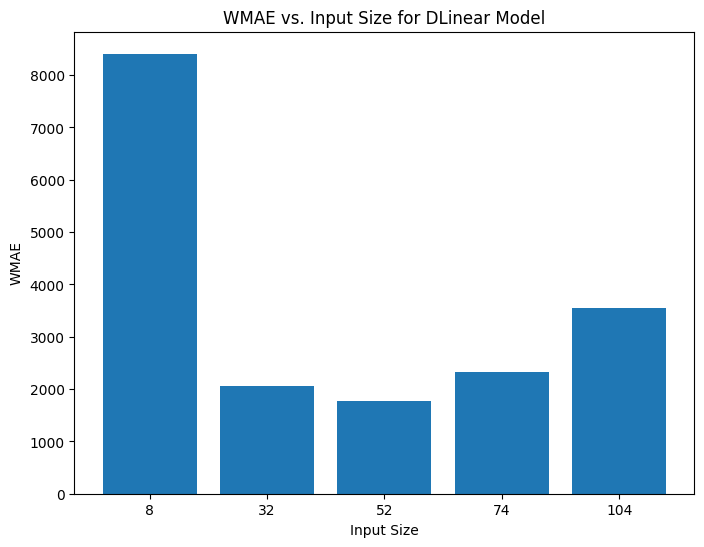

In [ ]:
import wandb
from neuralforecast import NeuralForecast
from neuralforecast.models import PatchTST
from neuralforecast.losses.pytorch import MAE

# sweep over these input sizes
input_sizes = [8, 32, 52, 74, 104]
val_results_per_size = {}

for inp_size in input_sizes:
    run_name = f"Trianing_PatchTST_input{inp_size}"
    wandb.init(
        project="ML_Final",
        name=run_name,
        reinit=True,
        config={"input_size": inp_size, "horizon": forecast_horizon}
    )

    # 1) Instantiate PatchTST with this input size
    patchtst = PatchTST(
        h=forecast_horizon,
        input_size=inp_size,

        # architecture (keep these fixed)
        patch_len=16,
        stride=8,
        encoder_layers=3,
        n_heads=8,
        hidden_size=128,

        # training
        loss=MAE(),
        learning_rate=1e-3,
        max_steps=1000,
        val_check_steps=100,
        early_stop_patience_steps=0,
        batch_size=32,

        # regularization
        dropout=0.1,
        fc_dropout=0.1,
        head_dropout=0.1,

        # scaling / norm
        scaler_type='robust',
        revin=True,

        # misc
        enable_progress_bar=True,
        random_seed=42
    )

    # 2) Log its hyper‐parameters to W&B
    log_patchtst_params(patchtst)

    # 3) Train
    nf = NeuralForecast(models=[patchtst], freq='W')
    nf.fit(df=train_final, val_size=0)

    # 4) Evaluate (includes a 5-day shift internally)
    metrics = evaluate_and_log_patchtst(
        nf=nf,
        train_df=train_final,
        val_df=val_final,
        y_val=y_val,
        w_val=w_val,
        shift_days=5,
        split="val"
    )
    val_results_per_size[inp_size] = metrics["WMAE"]

    wandb.finish()

print("WMAE by input_size:", val_results_per_size)

input_sizes = list(val_results_per_size.keys())
wmae_values = list(val_results_per_size.values())

plt.figure(figsize=(8, 6))
plt.bar([str(s) for s in input_sizes], wmae_values)
plt.xlabel("Input Size")
plt.ylabel("WMAE")
plt.title("WMAE vs. Input Size for DLinear Model")
plt.show()

# training 2 - tune input_size 2

INFO:lightning_fabric.utilities.seed:Seed set to 42


▶ Logging PatchTST params to W&B: {'h': 37, 'input_size': 38, 'learning_rate': 0.001, 'max_steps': 1000, 'val_check_steps': 100, 'early_stop_patience_steps': 0, 'batch_size': 32, 'random_seed': 42, 'loss': 'MAE'}


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 419 K  | train
-----------------------------------------------------------
419 K     Trainable params
3         Non-trainable params
419 K     Total params
1.676     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1878.4502  RMSE=4050.1680  WMAE=1900.2906


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1878.45025
val/RMSE,4050.168
val/WMAE,1900.29065


INFO:lightning_fabric.utilities.seed:Seed set to 42


▶ Logging PatchTST params to W&B: {'h': 37, 'input_size': 46, 'learning_rate': 0.001, 'max_steps': 1000, 'val_check_steps': 100, 'early_stop_patience_steps': 0, 'batch_size': 32, 'random_seed': 42, 'loss': 'MAE'}


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 423 K  | train
-----------------------------------------------------------
423 K     Trainable params
3         Non-trainable params
423 K     Total params
1.696     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1827.7890  RMSE=4134.2194  WMAE=1831.7064


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1827.78902
val/RMSE,4134.2194
val/WMAE,1831.70642


INFO:lightning_fabric.utilities.seed:Seed set to 42


▶ Logging PatchTST params to W&B: {'h': 37, 'input_size': 58, 'learning_rate': 0.001, 'max_steps': 1000, 'val_check_steps': 100, 'early_stop_patience_steps': 0, 'batch_size': 32, 'random_seed': 42, 'loss': 'MAE'}


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 433 K  | train
-----------------------------------------------------------
433 K     Trainable params
3         Non-trainable params
433 K     Total params
1.735     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1731.6758  RMSE=3735.2360  WMAE=1736.7938


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1731.67582
val/RMSE,3735.23597
val/WMAE,1736.79381


WMAE by input_size: {38: np.float64(1900.290646889206), 46: np.float64(1831.7064158469989), 58: np.float64(1736.7938134213284)}


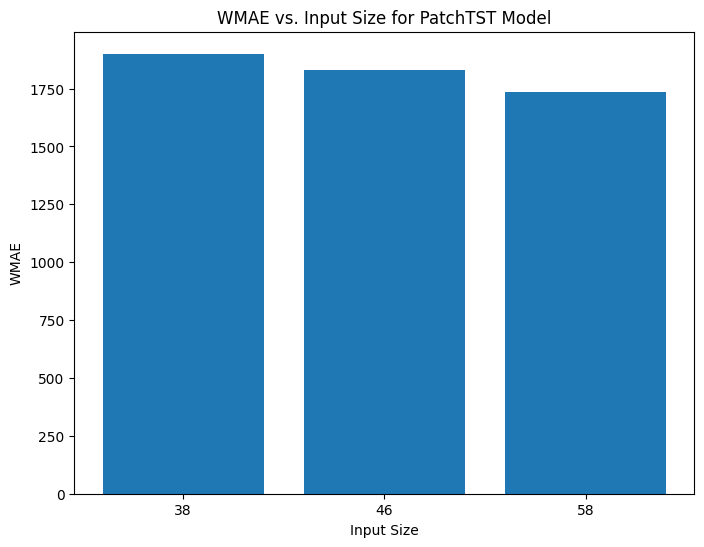

In [ ]:
import wandb
from neuralforecast import NeuralForecast
from neuralforecast.models import PatchTST
from neuralforecast.losses.pytorch import MAE

# sweep over these input sizes
input_sizes = [38, 46, 58]
val_results_per_size = {}

for inp_size in input_sizes:
    run_name = f"Trianing_PatchTST_input{inp_size}"
    wandb.init(
        project="ML_Final",
        name=run_name,
        reinit=True,
        config={"input_size": inp_size, "horizon": forecast_horizon}
    )

    # 1) Instantiate PatchTST with this input size
    patchtst = PatchTST(
        h=forecast_horizon,
        input_size=inp_size,

        # architecture (keep these fixed)
        patch_len=16,
        stride=8,
        encoder_layers=3,
        n_heads=8,
        hidden_size=128,

        # training
        loss=MAE(),
        learning_rate=1e-3,
        max_steps=1000,
        val_check_steps=100,
        early_stop_patience_steps=0,
        batch_size=32,

        # regularization
        dropout=0.1,
        fc_dropout=0.1,
        head_dropout=0.1,

        # scaling / norm
        scaler_type='robust',
        revin=True,

        # misc
        enable_progress_bar=True,
        random_seed=42
    )

    # 2) Log its hyper‐parameters to W&B
    log_patchtst_params(patchtst)

    # 3) Train
    nf = NeuralForecast(models=[patchtst], freq='W')
    nf.fit(df=train_final, val_size=0)

    # 4) Evaluate (includes a 5-day shift internally)
    metrics = evaluate_and_log_patchtst(
        nf=nf,
        train_df=train_final,
        val_df=val_final,
        y_val=y_val,
        w_val=w_val,
        shift_days=5,
        split="val"
    )
    val_results_per_size[inp_size] = metrics["WMAE"]

    wandb.finish()

print("WMAE by input_size:", val_results_per_size)

input_sizes = list(val_results_per_size.keys())
wmae_values = list(val_results_per_size.values())

plt.figure(figsize=(8, 6))
plt.bar([str(s) for s in input_sizes], wmae_values)
plt.xlabel("Input Size")
plt.ylabel("WMAE")
plt.title("WMAE vs. Input Size for PatchTST Model")
plt.show()

# training 3 - tune input_size 3

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 433 K  | train
-----------------------------------------------------------
433 K     Trainable params
3         Non-trainable params
433 K     Total params
1.735     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1872.0569  RMSE=4121.3111  WMAE=1884.9088


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1872.05691
val/RMSE,4121.31107
val/WMAE,1884.90878


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 433 K  | train
-----------------------------------------------------------
433 K     Trainable params
3         Non-trainable params
433 K     Total params
1.735     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1928.0984  RMSE=4105.7479  WMAE=1970.3475


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1928.09838
val/RMSE,4105.74785
val/WMAE,1970.34753


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 438 K  | train
-----------------------------------------------------------
438 K     Trainable params
3         Non-trainable params
438 K     Total params
1.754     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1836.7091  RMSE=4025.9910  WMAE=1842.5526


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1836.70906
val/RMSE,4025.99095
val/WMAE,1842.5526


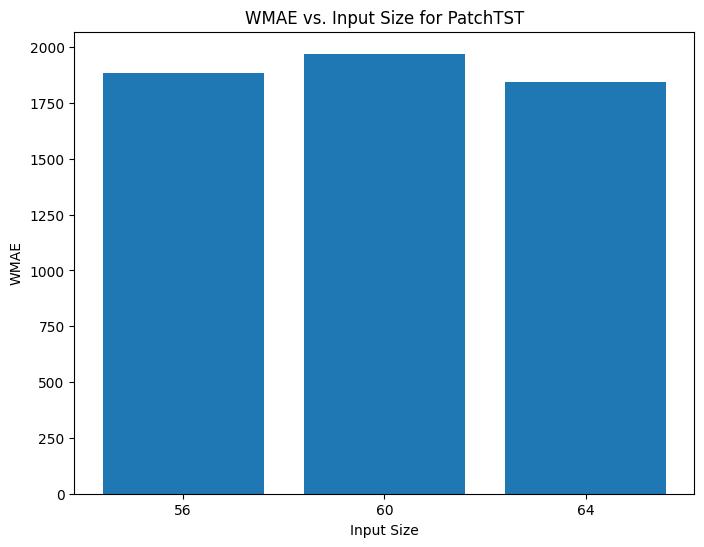

In [ ]:
# the values you’re sweeping over
input_sizes = [56, 60, 64]
val_results_per_size = {}

# fixed hyper-parameters
HORIZON = forecast_horizon
PATCH_LEN = 16
STRIDE = 8
ENCODER_LAYERS = 3
N_HEADS = 8
HIDDEN_SIZE = 128

LR = 1e-3
MAX_STEPS = 1000
VAL_CHECK_STEPS = 100
EARLY_STOP = 0
BATCH_SIZE = 32

DROPOUT = 0.1
FC_DROPOUT = 0.1
HEAD_DROPOUT = 0.1

SCALER = 'robust'
REVIN = True

PROGRESS = True
SEED = 42

LOSS_NAME = "MAE"

for inp_size in input_sizes:
    run_name = f"PatchTST_input{inp_size}"
    # 1) start W&B with the full, hardcoded config
    wandb.init(
        project="ML_Final",
        name=run_name,
        reinit=True,
        config={
            "horizon": HORIZON,
            "input_size": inp_size,
            "patch_len": PATCH_LEN,
            "stride": STRIDE,
            "encoder_layers": ENCODER_LAYERS,
            "n_heads": N_HEADS,
            "hidden_size": HIDDEN_SIZE,
            "learning_rate": LR,
            "max_steps": MAX_STEPS,
            "val_check_steps": VAL_CHECK_STEPS,
            "early_stop_patience_steps": EARLY_STOP,
            "batch_size": BATCH_SIZE,
            "dropout": DROPOUT,
            "fc_dropout": FC_DROPOUT,
            "head_dropout": HEAD_DROPOUT,
            "scaler_type": SCALER,
            "revin": REVIN,
            "enable_progress_bar": PROGRESS,
            "random_seed": SEED,
            "loss": LOSS_NAME,
        }
    )

    # 2) instantiate your model exactly with those same numbers
    patchtst = PatchTST(
        h=HORIZON,
        input_size=inp_size,
        patch_len=PATCH_LEN,
        stride=STRIDE,
        encoder_layers=ENCODER_LAYERS,
        n_heads=N_HEADS,
        hidden_size=HIDDEN_SIZE,

        loss=MAE(),
        learning_rate=LR,
        max_steps=MAX_STEPS,
        val_check_steps=VAL_CHECK_STEPS,
        early_stop_patience_steps=EARLY_STOP,
        batch_size=BATCH_SIZE,

        dropout=DROPOUT,
        fc_dropout=FC_DROPOUT,
        head_dropout=HEAD_DROPOUT,

        scaler_type=SCALER,
        revin=REVIN,

        enable_progress_bar=PROGRESS,
        random_seed=SEED
    )

    # 3) train
    nf = NeuralForecast(models=[patchtst], freq='W')
    nf.fit(df=train_final, val_size=0)

    # 4) evaluate (+ 5-day shift internally) and log MAE/RMSE/WMAE & plots
    metrics = evaluate_and_log_patchtst(
        nf=nf,
        train_df=train_final,
        val_df=val_final,
        y_val=y_val,
        w_val=w_val,
        shift_days=5,
        split="val"
    )
    val_results_per_size[inp_size] = metrics["WMAE"]

    wandb.finish()

# 5) Finally, plot your sweep results
plt.figure(figsize=(8, 6))
plt.bar([str(s) for s in val_results_per_size], val_results_per_size.values())
plt.xlabel("Input Size")
plt.ylabel("WMAE")
plt.title("WMAE vs. Input Size for PatchTST")
plt.show()


# training 4 - patch_len, stride

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 466 K  | train
-----------------------------------------------------------
466 K     Trainable params
3         Non-trainable params
466 K     Total params
1.867     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1762.1921  RMSE=3829.3140  WMAE=1766.7927


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1762.19206
val/RMSE,3829.31399
val/WMAE,1766.79268


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 458 K  | train
-----------------------------------------------------------
458 K     Trainable params
3         Non-trainable params
458 K     Total params
1.832     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1741.1912  RMSE=3837.6469  WMAE=1743.8570


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1741.19117
val/RMSE,3837.64695
val/WMAE,1743.85697


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 433 K  | train
-----------------------------------------------------------
433 K     Trainable params
3         Non-trainable params
433 K     Total params
1.735     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1731.6758  RMSE=3735.2360  WMAE=1736.7938


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1731.67582
val/RMSE,3735.23597
val/WMAE,1736.79381


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 440 K  | train
-----------------------------------------------------------
440 K     Trainable params
3         Non-trainable params
440 K     Total params
1.762     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1761.5427  RMSE=3853.8120  WMAE=1776.6357


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1761.5427
val/RMSE,3853.81195
val/WMAE,1776.63572


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 426 K  | train
-----------------------------------------------------------
426 K     Trainable params
3         Non-trainable params
426 K     Total params
1.704     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1773.3868  RMSE=3849.2642  WMAE=1775.1570


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1773.38678
val/RMSE,3849.26424
val/WMAE,1775.15705


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 416 K  | train
-----------------------------------------------------------
416 K     Trainable params
3         Non-trainable params
416 K     Total params
1.665     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1697.7226  RMSE=3668.6035  WMAE=1709.8324


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1697.72257
val/RMSE,3668.60355
val/WMAE,1709.83243


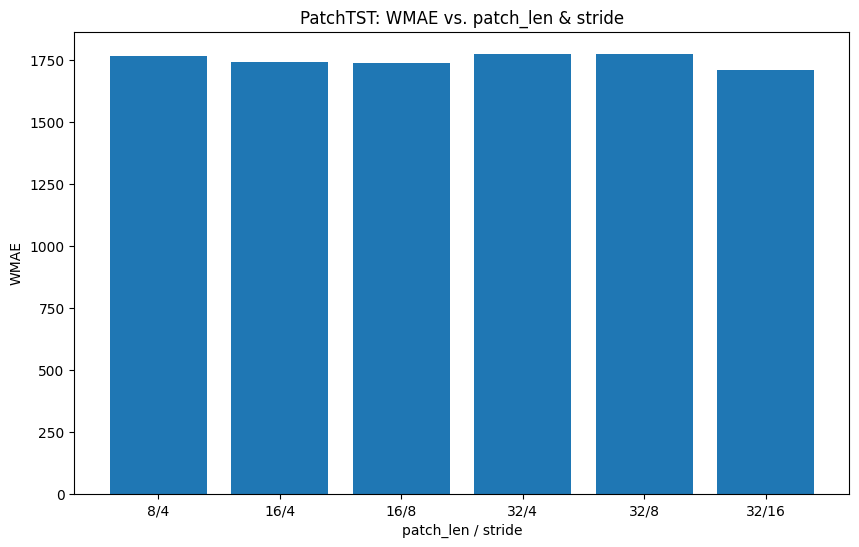

In [ ]:
import wandb
import matplotlib.pyplot as plt
from neuralforecast import NeuralForecast
from neuralforecast.models import PatchTST
from neuralforecast.losses.pytorch import MAE

# 1) Define the sweep grid of (patch_len, stride) pairs.
#    Note: stride must be < patch_len. A common rule: stride = patch_len // 2.
patch_lens = [8, 16, 32]
strides    = [4, 8, 16]

combos = [(pl, st) for pl in patch_lens for st in strides if st < pl]

# 2) Fixed hyperparams
HORIZON     = forecast_horizon
INPUT_SIZE  = 58 # best one
ENCODER_LAYERS = 3
N_HEADS     = 8
HIDDEN_SIZE = 128

LR              = 1e-3
MAX_STEPS       = 1000
VAL_CHECK       = 100
EARLY_STOP      = 0
BATCH_SIZE      = 32

DROPOUT     = 0.1
FC_DROPOUT  = 0.1
HEAD_DROPOUT= 0.1

SCALER_TYPE = 'robust'
REVIN       = True

PROGRESS    = True
SEED        = 42
LOSS_NAME   = "MAE"

results = {}

for (patch_len, stride) in combos:
    run_name = f"PatchTST_pl{patch_len}_st{stride}"
    # 3) Start new W&B run with ALL config hard‐coded
    wandb.init(
        project="ML_Final",
        name=run_name,
        reinit=True,
        config={
            "horizon": HORIZON,
            "input_size": INPUT_SIZE,
            "patch_len": patch_len,
            "stride": stride,
            "encoder_layers": ENCODER_LAYERS,
            "n_heads": N_HEADS,
            "hidden_size": HIDDEN_SIZE,
            "learning_rate": LR,
            "max_steps": MAX_STEPS,
            "val_check_steps": VAL_CHECK,
            "early_stop_patience_steps": EARLY_STOP,
            "batch_size": BATCH_SIZE,
            "dropout": DROPOUT,
            "fc_dropout": FC_DROPOUT,
            "head_dropout": HEAD_DROPOUT,
            "scaler_type": SCALER_TYPE,
            "revin": REVIN,
            "enable_progress_bar": PROGRESS,
            "random_seed": SEED,
            "loss": LOSS_NAME,
        }
    )

    # 4) Instantiate the model with this (patch_len, stride)
    model = PatchTST(
        h=HORIZON,
        input_size=INPUT_SIZE,
        patch_len=patch_len,
        stride=stride,
        encoder_layers=ENCODER_LAYERS,
        n_heads=N_HEADS,
        hidden_size=HIDDEN_SIZE,

        loss=MAE(),
        learning_rate=LR,
        max_steps=MAX_STEPS,
        val_check_steps=VAL_CHECK,
        early_stop_patience_steps=EARLY_STOP,
        batch_size=BATCH_SIZE,

        dropout=DROPOUT,
        fc_dropout=FC_DROPOUT,
        head_dropout=HEAD_DROPOUT,

        scaler_type=SCALER_TYPE,
        revin=REVIN,

        enable_progress_bar=PROGRESS,
        random_seed=SEED
    )

    # 5) Train
    nf = NeuralForecast(models=[model], freq='W')
    nf.fit(df=train_final, val_size=0)

    # 6) Evaluate (+ 5-day shift internally) and log
    metrics = evaluate_and_log_patchtst(
        nf=nf,
        train_df=train_final,
        val_df=val_final,
        y_val=y_val,
        w_val=w_val,
        shift_days=5,
        split="val"
    )
    results[(patch_len, stride)] = metrics["WMAE"]

    wandb.finish()

# 7) Plot the WMAE for each (patch_len, stride)
labels = [f"{pl}/{st}" for (pl,st) in results]
values = [results[key]    for key in results]

plt.figure(figsize=(10,6))
plt.bar(labels, values)
plt.xlabel("patch_len / stride")
plt.ylabel("WMAE")
plt.title("PatchTST: WMAE vs. patch_len & stride")
plt.show()


# training 5 - patch_len, stride

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 420 K  | train
-----------------------------------------------------------
420 K     Trainable params
3         Non-trainable params
420 K     Total params
1.681     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1711.0880  RMSE=3711.7131  WMAE=1716.8123


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1711.08797
val/RMSE,3711.71308
val/WMAE,1716.81232


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 416 K  | train
-----------------------------------------------------------
416 K     Trainable params
3         Non-trainable params
416 K     Total params
1.665     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1717.7135  RMSE=3632.7326  WMAE=1727.3619


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1717.71355
val/RMSE,3632.73255
val/WMAE,1727.36186


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 412 K  | train
-----------------------------------------------------------
412 K     Trainable params
3         Non-trainable params
412 K     Total params
1.650     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1673.5072  RMSE=3568.5775  WMAE=1681.9667


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1673.5072
val/RMSE,3568.57754
val/WMAE,1681.96668


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 413 K  | train
-----------------------------------------------------------
413 K     Trainable params
3         Non-trainable params
413 K     Total params
1.654     Total estimated model params size (MB)
90        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1737.4464  RMSE=3739.6948  WMAE=1751.1068


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1737.4464
val/RMSE,3739.69479
val/WMAE,1751.10678


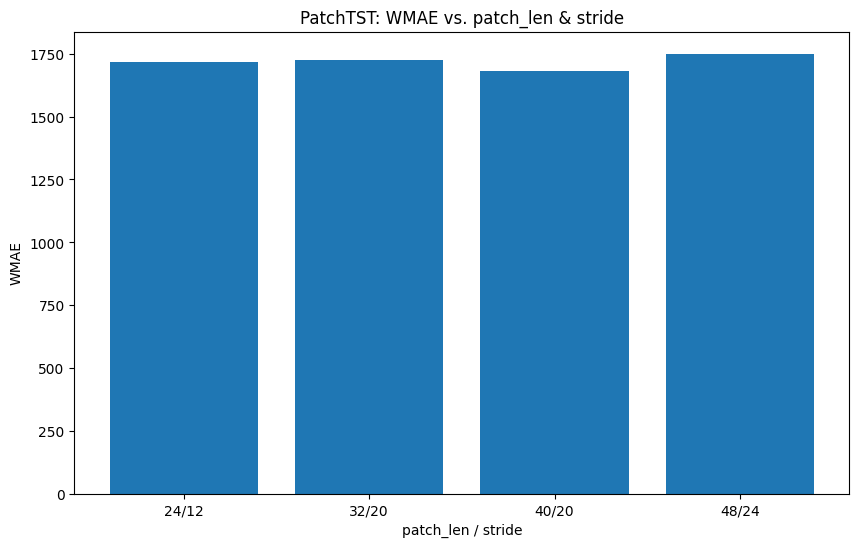

In [ ]:
import wandb
import matplotlib.pyplot as plt
from neuralforecast import NeuralForecast
from neuralforecast.models import PatchTST
from neuralforecast.losses.pytorch import MAE

# 1) Define the sweep grid of (patch_len, stride) pairs.
#    Note: stride must be < patch_len. A common rule: stride = patch_len // 2.
combos = [(24, 12), (32, 20), (40, 20), (48, 24)]

# 2) Fixed hyperparams
HORIZON     = forecast_horizon
INPUT_SIZE  = 58 # best one
ENCODER_LAYERS = 3
N_HEADS     = 8
HIDDEN_SIZE = 128

LR              = 1e-3
MAX_STEPS       = 1000
VAL_CHECK       = 100
EARLY_STOP      = 0
BATCH_SIZE      = 32

DROPOUT     = 0.1
FC_DROPOUT  = 0.1
HEAD_DROPOUT= 0.1

SCALER_TYPE = 'robust'
REVIN       = True

PROGRESS    = True
SEED        = 42
LOSS_NAME   = "MAE"

results = {}

for (patch_len, stride) in combos:
    run_name = f"PatchTST_pl{patch_len}_st{stride}"
    # 3) Start new W&B run with ALL config hard‐coded
    wandb.init(
        project="ML_Final",
        name=run_name,
        reinit=True,
        config={
            "horizon": HORIZON,
            "input_size": INPUT_SIZE,
            "patch_len": patch_len,
            "stride": stride,
            "encoder_layers": ENCODER_LAYERS,
            "n_heads": N_HEADS,
            "hidden_size": HIDDEN_SIZE,
            "learning_rate": LR,
            "max_steps": MAX_STEPS,
            "val_check_steps": VAL_CHECK,
            "early_stop_patience_steps": EARLY_STOP,
            "batch_size": BATCH_SIZE,
            "dropout": DROPOUT,
            "fc_dropout": FC_DROPOUT,
            "head_dropout": HEAD_DROPOUT,
            "scaler_type": SCALER_TYPE,
            "revin": REVIN,
            "enable_progress_bar": PROGRESS,
            "random_seed": SEED,
            "loss": LOSS_NAME,
        }
    )

    # 4) Instantiate the model with this (patch_len, stride)
    model = PatchTST(
        h=HORIZON,
        input_size=INPUT_SIZE,
        patch_len=patch_len,
        stride=stride,
        encoder_layers=ENCODER_LAYERS,
        n_heads=N_HEADS,
        hidden_size=HIDDEN_SIZE,

        loss=MAE(),
        learning_rate=LR,
        max_steps=MAX_STEPS,
        val_check_steps=VAL_CHECK,
        early_stop_patience_steps=EARLY_STOP,
        batch_size=BATCH_SIZE,

        dropout=DROPOUT,
        fc_dropout=FC_DROPOUT,
        head_dropout=HEAD_DROPOUT,

        scaler_type=SCALER_TYPE,
        revin=REVIN,

        enable_progress_bar=PROGRESS,
        random_seed=SEED
    )

    # 5) Train
    nf = NeuralForecast(models=[model], freq='W')
    nf.fit(df=train_final, val_size=0)

    # 6) Evaluate (+ 5-day shift internally) and log
    metrics = evaluate_and_log_patchtst(
        nf=nf,
        train_df=train_final,
        val_df=val_final,
        y_val=y_val,
        w_val=w_val,
        shift_days=5,
        split="val"
    )
    results[(patch_len, stride)] = metrics["WMAE"]

    wandb.finish()

# 7) Plot the WMAE for each (patch_len, stride)
labels = [f"{pl}/{st}" for (pl,st) in results]
values = [results[key]    for key in results]

plt.figure(figsize=(10,6))
plt.bar(labels, values)
plt.xlabel("patch_len / stride")
plt.ylabel("WMAE")
plt.title("PatchTST: WMAE vs. patch_len & stride")
plt.show()


# training 6 - tune encoder layers

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1658.1794  RMSE=3553.6095  WMAE=1667.2942


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1658.17942
val/RMSE,3553.6095
val/WMAE,1667.29423


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 279 K  | train
-----------------------------------------------------------
279 K     Trainable params
2         Non-trainable params
279 K     Total params
1.120     Total estimated model params size (MB)
65        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1677.9408  RMSE=3566.8670  WMAE=1686.1577


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1677.94083
val/RMSE,3566.86697
val/WMAE,1686.15774


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 544 K  | train
-----------------------------------------------------------
544 K     Trainable params
4         Non-trainable params
544 K     Total params
2.180     Total estimated model params size (MB)
115       Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1721.5909  RMSE=3655.4291  WMAE=1728.9322


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1721.59094
val/RMSE,3655.42908
val/WMAE,1728.93224


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 677 K  | train
-----------------------------------------------------------
677 K     Trainable params
5         Non-trainable params
677 K     Total params
2.710     Total estimated model params size (MB)
140       Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1714.8545  RMSE=3623.0958  WMAE=1724.5894


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1714.85445
val/RMSE,3623.09579
val/WMAE,1724.58941


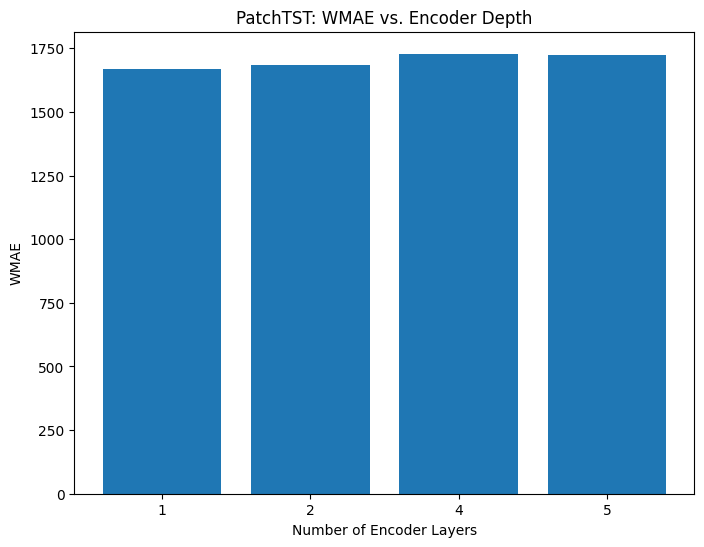

In [ ]:
import wandb
import matplotlib.pyplot as plt
from neuralforecast import NeuralForecast
from neuralforecast.models import PatchTST
from neuralforecast.losses.pytorch import MAE

# 1) Sweep over different numbers of encoder layers
encoder_layer_values = [1, 2, 4, 5]
results = {}

# 2) Fixed hyper-parameters (best so far)
HORIZON      = forecast_horizon
INPUT_SIZE   = 58
PATCH_LEN    = 40
STRIDE       = 20
N_HEADS      = 8
HIDDEN_SIZE  = 128

LR              = 1e-3
MAX_STEPS       = 1000
VAL_CHECK       = 100
EARLY_STOP      = 0
BATCH_SIZE      = 32

DROPOUT     = 0.1
FC_DROPOUT  = 0.1
HEAD_DROPOUT= 0.1

SCALER_TYPE = 'robust'
REVIN       = True

PROGRESS    = True
SEED        = 42
LOSS_NAME   = "MAE"

for n_layers in encoder_layer_values:
    run_name = f"PatchTST_enc{n_layers}"
    wandb.init(
        project="ML_Final",
        name=run_name,
        reinit=True,
        config={
            "horizon": HORIZON,
            "input_size": INPUT_SIZE,
            "patch_len": PATCH_LEN,
            "stride": STRIDE,
            "encoder_layers": n_layers,
            "n_heads": N_HEADS,
            "hidden_size": HIDDEN_SIZE,
            "learning_rate": LR,
            "max_steps": MAX_STEPS,
            "val_check_steps": VAL_CHECK,
            "early_stop_patience_steps": EARLY_STOP,
            "batch_size": BATCH_SIZE,
            "dropout": DROPOUT,
            "fc_dropout": FC_DROPOUT,
            "head_dropout": HEAD_DROPOUT,
            "scaler_type": SCALER_TYPE,
            "revin": REVIN,
            "enable_progress_bar": PROGRESS,
            "random_seed": SEED,
            "loss": LOSS_NAME,
        }
    )

    # 3) Instantiate the model with this number of encoder layers
    model = PatchTST(
        h=HORIZON,
        input_size=INPUT_SIZE,
        patch_len=PATCH_LEN,
        stride=STRIDE,
        encoder_layers=n_layers,
        n_heads=N_HEADS,
        hidden_size=HIDDEN_SIZE,

        loss=MAE(),
        learning_rate=LR,
        max_steps=MAX_STEPS,
        val_check_steps=VAL_CHECK,
        early_stop_patience_steps=EARLY_STOP,
        batch_size=BATCH_SIZE,

        dropout=DROPOUT,
        fc_dropout=FC_DROPOUT,
        head_dropout=HEAD_DROPOUT,

        scaler_type=SCALER_TYPE,
        revin=REVIN,

        enable_progress_bar=PROGRESS,
        random_seed=SEED
    )

    # 4) Train
    nf = NeuralForecast(models=[model], freq='W')
    nf.fit(df=train_final, val_size=0)

    # 5) Evaluate (+5-day shift internally)
    metrics = evaluate_and_log_patchtst(
        nf=nf,
        train_df=train_final,
        val_df=val_final,
        y_val=y_val,
        w_val=w_val,
        shift_days=5,
        split="val"
    )
    results[n_layers] = metrics["WMAE"]

    wandb.finish()

# 6) Plot WMAE vs. # encoder layers
plt.figure(figsize=(8,6))
plt.bar([str(n) for n in results], list(results.values()))
plt.xlabel("Number of Encoder Layers")
plt.ylabel("WMAE")
plt.title("PatchTST: WMAE vs. Encoder Depth")
plt.show()


# training 7 - tune n_heads

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1671.7213  RMSE=3592.8075  WMAE=1678.5244


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1671.72135
val/RMSE,3592.80753
val/WMAE,1678.52442


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1679.8283  RMSE=3600.7183  WMAE=1685.7677


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1679.82834
val/RMSE,3600.71827
val/WMAE,1685.76768


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1652.7012  RMSE=3545.2220  WMAE=1663.3115


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1652.70119
val/RMSE,3545.22198
val/WMAE,1663.31154


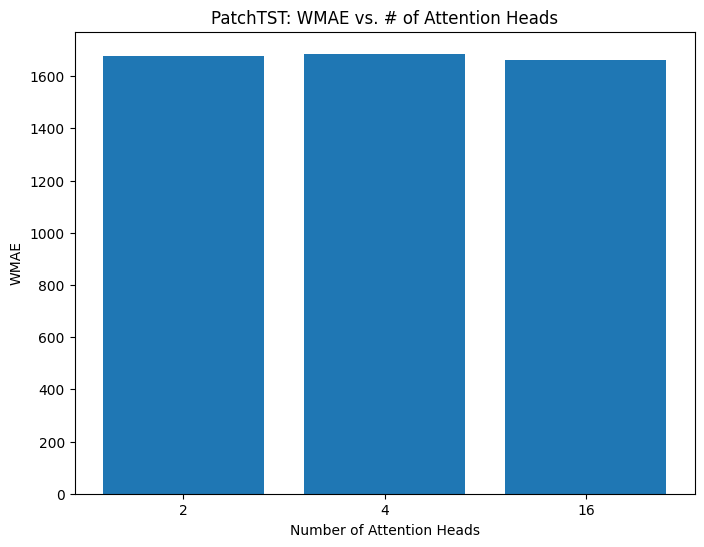

In [ ]:
import wandb
import matplotlib.pyplot as plt
from neuralforecast import NeuralForecast
from neuralforecast.models import PatchTST
from neuralforecast.losses.pytorch import MAE

# 1) Sweep over different numbers of attention heads
head_values = [2, 4 , 16]
results = {}

# 2) Fixed hyper-parameters (best so far)
HORIZON       = forecast_horizon
INPUT_SIZE    = 58
PATCH_LEN     = 40
STRIDE        = 20
ENCODER_LAYERS= 1      # you found this to be best
HIDDEN_SIZE   = 128

LR            = 1e-3
MAX_STEPS     = 1000
VAL_CHECK     = 100
EARLY_STOP    = 0
BATCH_SIZE    = 32

DROPOUT       = 0.1
FC_DROPOUT    = 0.1
HEAD_DROPOUT  = 0.1

SCALER_TYPE   = 'robust'
REVIN         = True

PROGRESS      = True
SEED          = 42
LOSS_NAME     = "MAE"

for n_heads in head_values:
    run_name = f"PatchTST_heads{n_heads}"
    wandb.init(
        project="ML_Final",
        name=run_name,
        reinit=True,
        config={
            "horizon": HORIZON,
            "input_size": INPUT_SIZE,
            "patch_len": PATCH_LEN,
            "stride": STRIDE,
            "encoder_layers": ENCODER_LAYERS,
            "n_heads": n_heads,
            "hidden_size": HIDDEN_SIZE,
            "learning_rate": LR,
            "max_steps": MAX_STEPS,
            "val_check_steps": VAL_CHECK,
            "early_stop_patience_steps": EARLY_STOP,
            "batch_size": BATCH_SIZE,
            "dropout": DROPOUT,
            "fc_dropout": FC_DROPOUT,
            "head_dropout": HEAD_DROPOUT,
            "scaler_type": SCALER_TYPE,
            "revin": REVIN,
            "enable_progress_bar": PROGRESS,
            "random_seed": SEED,
            "loss": LOSS_NAME,
        }
    )

    # 3) Instantiate with this many heads
    model = PatchTST(
        h=HORIZON,
        input_size=INPUT_SIZE,
        patch_len=PATCH_LEN,
        stride=STRIDE,
        encoder_layers=ENCODER_LAYERS,
        n_heads=n_heads,
        hidden_size=HIDDEN_SIZE,

        loss=MAE(),
        learning_rate=LR,
        max_steps=MAX_STEPS,
        val_check_steps=VAL_CHECK,
        early_stop_patience_steps=EARLY_STOP,
        batch_size=BATCH_SIZE,

        dropout=DROPOUT,
        fc_dropout=FC_DROPOUT,
        head_dropout=HEAD_DROPOUT,

        scaler_type=SCALER_TYPE,
        revin=REVIN,

        enable_progress_bar=PROGRESS,
        random_seed=SEED
    )

    # 4) Train
    nf = NeuralForecast(models=[model], freq='W')
    nf.fit(df=train_final, val_size=0)

    # 5) Evaluate & log
    metrics = evaluate_and_log_patchtst(
        nf=nf,
        train_df=train_final,
        val_df=val_final,
        y_val=y_val,
        w_val=w_val,
        shift_days=5,
        split="val"
    )
    results[n_heads] = metrics["WMAE"]

    wandb.finish()

# 6) Plot WMAE vs number of heads
plt.figure(figsize=(8,6))
plt.bar([str(h) for h in results], list(results.values()))
plt.xlabel("Number of Attention Heads")
plt.ylabel("WMAE")
plt.title("PatchTST: WMAE vs. # of Attention Heads")
plt.show()


# training 8 - hidden size

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 57.5 K | train
-----------------------------------------------------------
57.5 K    Trainable params
1         Non-trainable params
57.5 K    Total params
0.230     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1670.5266  RMSE=3559.3302  WMAE=1679.7570


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1670.52663
val/RMSE,3559.33016
val/WMAE,1679.75704


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1652.7012  RMSE=3545.2220  WMAE=1663.3115


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1652.70119
val/RMSE,3545.22198
val/WMAE,1663.31154


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 425 K  | train
-----------------------------------------------------------
425 K     Trainable params
1         Non-trainable params
425 K     Total params
1.703     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1719.8648  RMSE=3710.2411  WMAE=1732.6469


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1719.86478
val/RMSE,3710.24105
val/WMAE,1732.64689


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 1.4 M  | train
-----------------------------------------------------------
1.4 M     Trainable params
1         Non-trainable params
1.4 M     Total params
5.502     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1683.2693  RMSE=3570.6983  WMAE=1710.8974


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1683.26928
val/RMSE,3570.69831
val/WMAE,1710.8974


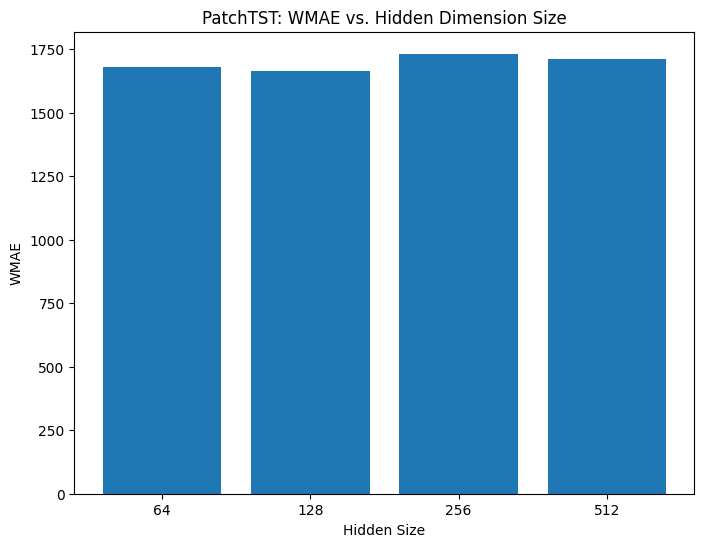

In [ ]:
import wandb
import matplotlib.pyplot as plt
from neuralforecast import NeuralForecast
from neuralforecast.models import PatchTST
from neuralforecast.losses.pytorch import MAE

# 1) Sweep over different hidden_size values
hidden_sizes = [64, 128, 256, 512]
results = {}

# 2) Fixed hyper-parameters (best so far)
HORIZON        = forecast_horizon
INPUT_SIZE     = 58
PATCH_LEN      = 40
STRIDE         = 20
ENCODER_LAYERS = 1
N_HEADS        = 16  # best
LR             = 1e-3
MAX_STEPS      = 1000
VAL_CHECK      = 100
EARLY_STOP     = 0
BATCH_SIZE     = 32

DROPOUT      = 0.1
FC_DROPOUT   = 0.1
HEAD_DROPOUT = 0.1

SCALER_TYPE = 'robust'
REVIN       = True

PROGRESS  = True
SEED      = 42
LOSS_NAME = "MAE"

for hid in hidden_sizes:
    run_name = f"PatchTST_hidden{hid}"
    wandb.init(
        project="ML_Final",
        name=run_name,
        reinit=True,
        config={
            "horizon": HORIZON,
            "input_size": INPUT_SIZE,
            "patch_len": PATCH_LEN,
            "stride": STRIDE,
            "encoder_layers": ENCODER_LAYERS,
            "n_heads": N_HEADS,
            "hidden_size": hid,
            "learning_rate": LR,
            "max_steps": MAX_STEPS,
            "val_check_steps": VAL_CHECK,
            "early_stop_patience_steps": EARLY_STOP,
            "batch_size": BATCH_SIZE,
            "dropout": DROPOUT,
            "fc_dropout": FC_DROPOUT,
            "head_dropout": HEAD_DROPOUT,
            "scaler_type": SCALER_TYPE,
            "revin": REVIN,
            "enable_progress_bar": PROGRESS,
            "random_seed": SEED,
            "loss": LOSS_NAME,
        }
    )

    # 3) Instantiate the model with this hidden_size
    model = PatchTST(
        h=HORIZON,
        input_size=INPUT_SIZE,
        patch_len=PATCH_LEN,
        stride=STRIDE,
        encoder_layers=ENCODER_LAYERS,
        n_heads=N_HEADS,
        hidden_size=hid,

        loss=MAE(),
        learning_rate=LR,
        max_steps=MAX_STEPS,
        val_check_steps=VAL_CHECK,
        early_stop_patience_steps=EARLY_STOP,
        batch_size=BATCH_SIZE,

        dropout=DROPOUT,
        fc_dropout=FC_DROPOUT,
        head_dropout=HEAD_DROPOUT,

        scaler_type=SCALER_TYPE,
        revin=REVIN,

        enable_progress_bar=PROGRESS,
        random_seed=SEED
    )

    # 4) Train
    nf = NeuralForecast(models=[model], freq='W')
    nf.fit(df=train_final, val_size=0)

    # 5) Evaluate (+5-day shift internally)
    metrics = evaluate_and_log_patchtst(
        nf=nf,
        train_df=train_final,
        val_df=val_final,
        y_val=y_val,
        w_val=w_val,
        shift_days=5,
        split="val"
    )
    results[hid] = metrics["WMAE"]

    wandb.finish()

# 6) Plot WMAE vs. hidden_size
plt.figure(figsize=(8,6))
plt.bar([str(h) for h in results], list(results.values()))
plt.xlabel("Hidden Size")
plt.ylabel("WMAE")
plt.title("PatchTST: WMAE vs. Hidden Dimension Size")
plt.show()


# training 9 - tune dropout

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1666.9712  RMSE=3568.8974  WMAE=1672.5379


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1666.97118
val/RMSE,3568.89742
val/WMAE,1672.53785


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1652.7012  RMSE=3545.2220  WMAE=1663.3115


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1652.70119
val/RMSE,3545.22198
val/WMAE,1663.31154


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1666.7326  RMSE=3577.2824  WMAE=1679.8886


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1666.73256
val/RMSE,3577.28235
val/WMAE,1679.88863


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1672.3754  RMSE=3569.9391  WMAE=1687.0514


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1672.37536
val/RMSE,3569.93905
val/WMAE,1687.05142


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1802.6446  RMSE=3809.4092  WMAE=1821.1131


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1802.64463
val/RMSE,3809.40924
val/WMAE,1821.11311


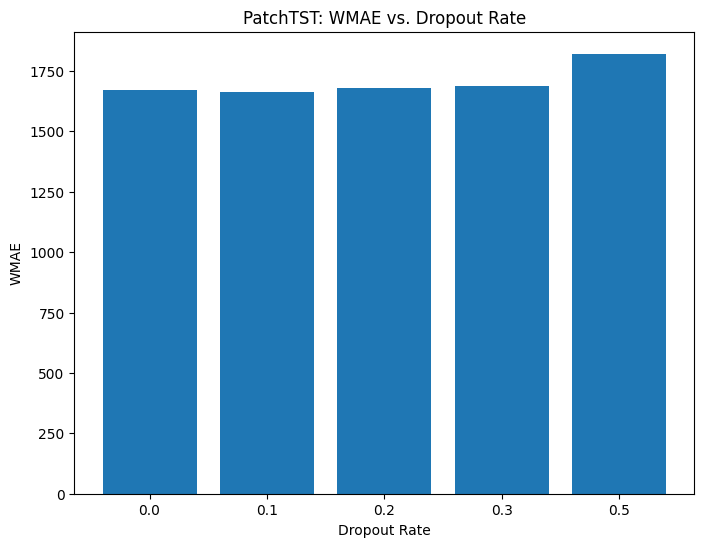

In [ ]:
import wandb
import matplotlib.pyplot as plt
from neuralforecast import NeuralForecast
from neuralforecast.models import PatchTST
from neuralforecast.losses.pytorch import MAE

# 1) Sweep over different dropout rates
dropout_rates = [0.0, 0.1, 0.2, 0.3, 0.5]
results = {}

# 2) Fixed hyper-parameters (best so far)
HORIZON        = forecast_horizon
INPUT_SIZE     = 58
PATCH_LEN      = 40
STRIDE         = 20
ENCODER_LAYERS = 1
N_HEADS        = 16
HIDDEN_SIZE    = 128

LR             = 1e-3
MAX_STEPS      = 1000
VAL_CHECK      = 100
EARLY_STOP     = 0
BATCH_SIZE     = 32

FC_DROPOUT     = 0.1  # keep these fixed
HEAD_DROPOUT   = 0.1

SCALER_TYPE    = 'robust'
REVIN          = True

PROGRESS       = True
SEED           = 42
LOSS_NAME      = "MAE"

for dr in dropout_rates:
    run_name = f"PatchTST_dropout{dr}"
    wandb.init(
        project="ML_Final",
        name=run_name,
        reinit=True,
        config={
            "horizon":                HORIZON,
            "input_size":             INPUT_SIZE,
            "patch_len":              PATCH_LEN,
            "stride":                 STRIDE,
            "encoder_layers":         ENCODER_LAYERS,
            "n_heads":                N_HEADS,
            "hidden_size":            HIDDEN_SIZE,
            "learning_rate":          LR,
            "max_steps":              MAX_STEPS,
            "val_check_steps":        VAL_CHECK,
            "early_stop_patience_steps": EARLY_STOP,
            "batch_size":             BATCH_SIZE,
            "dropout":                dr,
            "fc_dropout":             FC_DROPOUT,
            "head_dropout":           HEAD_DROPOUT,
            "scaler_type":            SCALER_TYPE,
            "revin":                  REVIN,
            "enable_progress_bar":    PROGRESS,
            "random_seed":            SEED,
            "loss":                   LOSS_NAME,
        }
    )

    # 3) Instantiate the model with this dropout rate
    model = PatchTST(
        h=HORIZON,
        input_size=INPUT_SIZE,
        patch_len=PATCH_LEN,
        stride=STRIDE,
        encoder_layers=ENCODER_LAYERS,
        n_heads=N_HEADS,
        hidden_size=HIDDEN_SIZE,

        loss=MAE(),
        learning_rate=LR,
        max_steps=MAX_STEPS,
        val_check_steps=VAL_CHECK,
        early_stop_patience_steps=EARLY_STOP,
        batch_size=BATCH_SIZE,

        dropout=dr,
        fc_dropout=FC_DROPOUT,
        head_dropout=HEAD_DROPOUT,

        scaler_type=SCALER_TYPE,
        revin=REVIN,

        enable_progress_bar=PROGRESS,
        random_seed=SEED
    )

    # 4) Train
    nf = NeuralForecast(models=[model], freq='W')
    nf.fit(df=train_final, val_size=0)

    # 5) Evaluate & log
    metrics = evaluate_and_log_patchtst(
        nf=nf,
        train_df=train_final,
        val_df=val_final,
        y_val=y_val,
        w_val=w_val,
        shift_days=5,
        split="val"
    )
    results[dr] = metrics["WMAE"]

    wandb.finish()

# 6) Plot WMAE vs. dropout rate
plt.figure(figsize=(8,6))
plt.bar([str(d) for d in results], list(results.values()))
plt.xlabel("Dropout Rate")
plt.ylabel("WMAE")
plt.title("PatchTST: WMAE vs. Dropout Rate")
plt.show()


# training 10 - fc and head dropouts

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1659.3970  RMSE=3559.8374  WMAE=1667.6003


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1659.39702
val/RMSE,3559.83738
val/WMAE,1667.60026


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1652.7012  RMSE=3545.2220  WMAE=1663.3115


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1652.70119
val/RMSE,3545.22198
val/WMAE,1663.31154


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1722.1494  RMSE=3716.5074  WMAE=1728.4342


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1722.1494
val/RMSE,3716.50743
val/WMAE,1728.43417


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1855.2651  RMSE=4014.3165  WMAE=1866.6457


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1855.26511
val/RMSE,4014.3165
val/WMAE,1866.64573


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1659.3970  RMSE=3559.8374  WMAE=1667.6003


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1659.39702
val/RMSE,3559.83738
val/WMAE,1667.60026


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1652.7012  RMSE=3545.2220  WMAE=1663.3115


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1652.70119
val/RMSE,3545.22198
val/WMAE,1663.31154


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1722.1494  RMSE=3716.5074  WMAE=1728.4342


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1722.1494
val/RMSE,3716.50743
val/WMAE,1728.43417


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1855.2651  RMSE=4014.3165  WMAE=1866.6457


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1855.26511
val/RMSE,4014.3165
val/WMAE,1866.64573


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1659.3970  RMSE=3559.8374  WMAE=1667.6003


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1659.39702
val/RMSE,3559.83738
val/WMAE,1667.60026


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1652.7012  RMSE=3545.2220  WMAE=1663.3115


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1652.70119
val/RMSE,3545.22198
val/WMAE,1663.31154


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1722.1494  RMSE=3716.5074  WMAE=1728.4342


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1722.1494
val/RMSE,3716.50743
val/WMAE,1728.43417


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1855.2651  RMSE=4014.3165  WMAE=1866.6457


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1855.26511
val/RMSE,4014.3165
val/WMAE,1866.64573


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1659.3970  RMSE=3559.8374  WMAE=1667.6003


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1659.39702
val/RMSE,3559.83738
val/WMAE,1667.60026


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1652.7012  RMSE=3545.2220  WMAE=1663.3115


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1652.70119
val/RMSE,3545.22198
val/WMAE,1663.31154


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1722.1494  RMSE=3716.5074  WMAE=1728.4342


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1722.1494
val/RMSE,3716.50743
val/WMAE,1728.43417


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1855.2651  RMSE=4014.3165  WMAE=1866.6457


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1855.26511
val/RMSE,4014.3165
val/WMAE,1866.64573


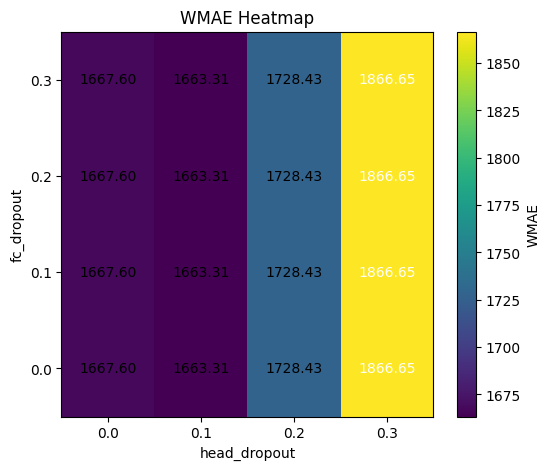

In [ ]:
import wandb
import matplotlib.pyplot as plt
from neuralforecast import NeuralForecast
from neuralforecast.models import PatchTST
from neuralforecast.losses.pytorch import MAE
import numpy as np

# 1) Sweep grid for fc_dropout and head_dropout
fc_rates   = [0.0, 0.1, 0.2, 0.3]
head_rates = [0.0, 0.1, 0.2, 0.3]

results = {}

# 2) All other hyper-parameters fixed at your best values
HORIZON        = forecast_horizon
INPUT_SIZE     = 58
PATCH_LEN      = 40
STRIDE         = 20
ENCODER_LAYERS = 1
N_HEADS        = 16
HIDDEN_SIZE    = 128

LR          = 1e-3
MAX_STEPS   = 1000
VAL_CHECK   = 100
EARLY_STOP  = 0
BATCH_SIZE  = 32

DROPOUT     = 0.1    # main residual-dropout

SCALER_TYPE = 'robust'
REVIN       = True

PROGRESS    = True
SEED        = 42
LOSS_NAME   = "MAE"

for fc_dr in fc_rates:
    for head_dr in head_rates:
        run_name = f"PatchTST_fc{fc_dr}_head{head_dr}"
        # 3) Start W&B run
        wandb.init(
            project="ML_Final",
            name=run_name,
            reinit=True,
            config={
                "horizon":                  HORIZON,
                "input_size":               INPUT_SIZE,
                "patch_len":                PATCH_LEN,
                "stride":                   STRIDE,
                "encoder_layers":           ENCODER_LAYERS,
                "n_heads":                  N_HEADS,
                "hidden_size":              HIDDEN_SIZE,
                "learning_rate":            LR,
                "max_steps":                MAX_STEPS,
                "val_check_steps":          VAL_CHECK,
                "early_stop_patience_steps":EARLY_STOP,
                "batch_size":               BATCH_SIZE,
                "dropout":                  DROPOUT,
                "fc_dropout":               fc_dr,
                "head_dropout":             head_dr,
                "scaler_type":              SCALER_TYPE,
                "revin":                    REVIN,
                "enable_progress_bar":      PROGRESS,
                "random_seed":              SEED,
                "loss":                     LOSS_NAME,
            }
        )

        # 4) Instantiate model
        model = PatchTST(
            h=HORIZON,
            input_size=INPUT_SIZE,
            patch_len=PATCH_LEN,
            stride=STRIDE,
            encoder_layers=ENCODER_LAYERS,
            n_heads=N_HEADS,
            hidden_size=HIDDEN_SIZE,

            loss=MAE(),
            learning_rate=LR,
            max_steps=MAX_STEPS,
            val_check_steps=VAL_CHECK,
            early_stop_patience_steps=EARLY_STOP,
            batch_size=BATCH_SIZE,

            dropout=DROPOUT,
            fc_dropout=fc_dr,
            head_dropout=head_dr,

            scaler_type=SCALER_TYPE,
            revin=REVIN,

            enable_progress_bar=PROGRESS,
            random_seed=SEED
        )

        # 5) Train
        nf = NeuralForecast(models=[model], freq='W')
        nf.fit(df=train_final, val_size=0)

        # 6) Evaluate (+5-day shift internally)
        metrics = evaluate_and_log_patchtst(
            nf=nf,
            train_df=train_final,
            val_df=val_final,
            y_val=y_val,
            w_val=w_val,
            shift_days=5,
            split="val"
        )
        results[(fc_dr, head_dr)] = metrics["WMAE"]

        wandb.finish()

# 7) Visualize results as a heatmap
fc_list   = fc_rates
head_list = head_rates
heatmap   = np.zeros((len(fc_list), len(head_list)))

for i, fc_dr in enumerate(fc_list):
    for j, head_dr in enumerate(head_list):
        heatmap[i, j] = results[(fc_dr, head_dr)]

fig, ax = plt.subplots(figsize=(6,5))
im = ax.imshow(heatmap, origin='lower', aspect='auto')
ax.set_xticks(np.arange(len(head_list)))
ax.set_yticks(np.arange(len(fc_list)))
ax.set_xticklabels(head_list)
ax.set_yticklabels(fc_list)
ax.set_xlabel("head_dropout")
ax.set_ylabel("fc_dropout")
ax.set_title("WMAE Heatmap")

# annotate
for i in range(len(fc_list)):
    for j in range(len(head_list)):
        text = ax.text(j, i, f"{heatmap[i,j]:.2f}",
                       ha="center", va="center", color="w" if heatmap[i,j]>np.mean(heatmap) else "black")
plt.colorbar(im, ax=ax, label="WMAE")
plt.show()


# training 11 - tune rl, max_steps

wandb: WARNING Using a boolean value for 'reinit' is deprecated. Use 'return_previous' or 'finish_previous' instead.


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=2051.1113  RMSE=4334.4976  WMAE=2081.6307


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,2051.11126
val/RMSE,4334.4976
val/WMAE,2081.63069


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=2154.8994  RMSE=4727.5954  WMAE=2146.0708


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,2154.89941
val/RMSE,4727.59541
val/WMAE,2146.07079


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=2000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1735.5915  RMSE=3741.1688  WMAE=1740.6994


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1735.59147
val/RMSE,3741.1688
val/WMAE,1740.69942


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=4000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1738.2362  RMSE=3747.8558  WMAE=1742.5756


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1738.23617
val/RMSE,3747.85579
val/WMAE,1742.57557


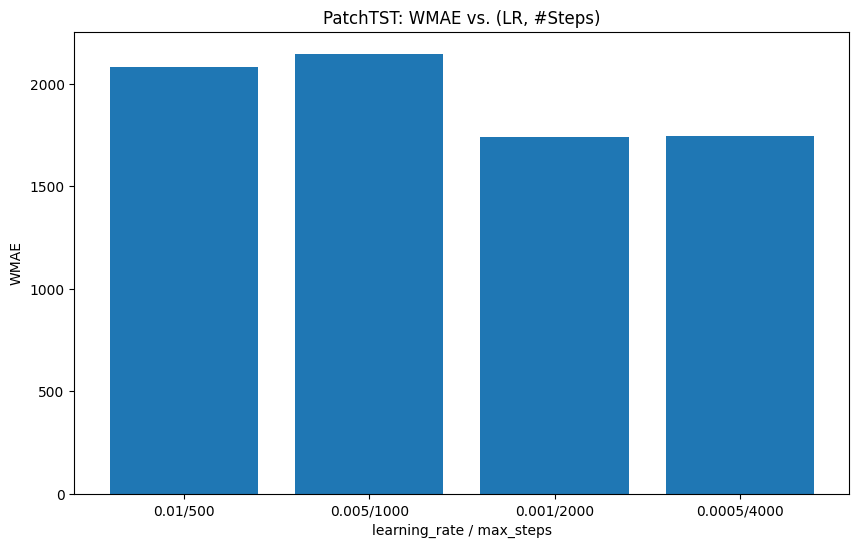

In [ ]:
import wandb
import matplotlib.pyplot as plt
from neuralforecast import NeuralForecast
from neuralforecast.models import PatchTST
from neuralforecast.losses.pytorch import MAE

# 1) Define coupled (learning_rate, max_steps) pairs
#    More steps → lower lr; fewer steps → higher lr
lr_steps = [
    (1e-2,  500),
    (5e-3, 1000),
    (1e-3, 2000),
    (5e-4, 4000),
]

results = {}

# 2) Fixed best parameters from previous sweeps
HORIZON        = forecast_horizon
INPUT_SIZE     = 58
PATCH_LEN      = 40
STRIDE         = 20
ENCODER_LAYERS = 1
N_HEADS        = 16
HIDDEN_SIZE    = 128

VAL_CHECK      = 100
EARLY_STOP     = 0
BATCH_SIZE     = 32

DROPOUT        = 0.1
FC_DROPOUT     = 0.2
HEAD_DROPOUT   = 0.1

SCALER_TYPE    = 'robust'
REVIN          = True

PROGRESS       = True
SEED           = 42
LOSS_NAME      = "MAE"

for lr, max_steps in lr_steps:
    run_name = f"PatchTST_lr{lr}_steps{max_steps}"
    wandb.init(
        project="ML_Final",
        name=run_name,
        reinit=True,
        config={
            "horizon":                  HORIZON,
            "input_size":               INPUT_SIZE,
            "patch_len":                PATCH_LEN,
            "stride":                   STRIDE,
            "encoder_layers":           ENCODER_LAYERS,
            "n_heads":                  N_HEADS,
            "hidden_size":              HIDDEN_SIZE,
            "learning_rate":            lr,
            "max_steps":                max_steps,
            "val_check_steps":          VAL_CHECK,
            "early_stop_patience_steps":EARLY_STOP,
            "batch_size":               BATCH_SIZE,
            "dropout":                  DROPOUT,
            "fc_dropout":               FC_DROPOUT,
            "head_dropout":             HEAD_DROPOUT,
            "scaler_type":              SCALER_TYPE,
            "revin":                    REVIN,
            "enable_progress_bar":      PROGRESS,
            "random_seed":              SEED,
            "loss":                     LOSS_NAME,
        }
    )

    # 3) Instantiate with this lr & max_steps
    model = PatchTST(
        h=HORIZON,
        input_size=INPUT_SIZE,
        patch_len=PATCH_LEN,
        stride=STRIDE,
        encoder_layers=ENCODER_LAYERS,
        n_heads=N_HEADS,
        hidden_size=HIDDEN_SIZE,

        loss=MAE(),
        learning_rate=lr,
        max_steps=max_steps,
        val_check_steps=VAL_CHECK,
        early_stop_patience_steps=EARLY_STOP,
        batch_size=BATCH_SIZE,

        dropout=DROPOUT,
        fc_dropout=FC_DROPOUT,
        head_dropout=HEAD_DROPOUT,

        scaler_type=SCALER_TYPE,
        revin=REVIN,

        enable_progress_bar=PROGRESS,
        random_seed=SEED
    )

    # 4) Train
    nf = NeuralForecast(models=[model], freq='W')
    nf.fit(df=train_final, val_size=0)

    # 5) Evaluate & log
    metrics = evaluate_and_log_patchtst(
        nf=nf,
        train_df=train_final,
        val_df=val_final,
        y_val=y_val,
        w_val=w_val,
        shift_days=5,
        split="val"
    )
    results[(lr, max_steps)] = metrics["WMAE"]

    wandb.finish()

# 6) Plot WMAE for each (lr, max_steps)
labels = [f"{lr}/{steps}" for lr, steps in results]
values = list(results.values())

plt.figure(figsize=(10,6))
plt.bar(labels, values)
plt.xlabel("learning_rate / max_steps")
plt.ylabel("WMAE")
plt.title("PatchTST: WMAE vs. (LR, #Steps)")
plt.show()


# trianing 12 - fine tune rl, max_steps

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=2006.1772  RMSE=4385.5103  WMAE=1980.0911


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,2006.1772
val/RMSE,4385.51031
val/WMAE,1980.09111


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1873.5506  RMSE=4084.0218  WMAE=1863.3654


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1873.5506
val/RMSE,4084.02179
val/WMAE,1863.3654


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1742.2901  RMSE=3780.7190  WMAE=1739.0188


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1742.29013
val/RMSE,3780.71904
val/WMAE,1739.01881


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1705.4090  RMSE=3696.1610  WMAE=1708.2713


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1705.40896
val/RMSE,3696.16098
val/WMAE,1708.27131


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=2000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1718.8978  RMSE=3723.5050  WMAE=1732.0131


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1718.89782
val/RMSE,3723.50502
val/WMAE,1732.01309


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1728.1871  RMSE=3721.8961  WMAE=1743.2028


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1728.18708
val/RMSE,3721.89609
val/WMAE,1743.20284


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1864.8944  RMSE=3983.5760  WMAE=1874.8048


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1864.89445
val/RMSE,3983.57597
val/WMAE,1874.80485


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 147 K  | train
-----------------------------------------------------------
147 K     Trainable params
1         Non-trainable params
147 K     Total params
0.590     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] MAE=1817.3629  RMSE=3984.6129  WMAE=1814.9194


val/MAE,▁
val/RMSE,▁
val/WMAE,▁
val/MAE,1817.36295
val/RMSE,3984.61289
val/WMAE,1814.91936


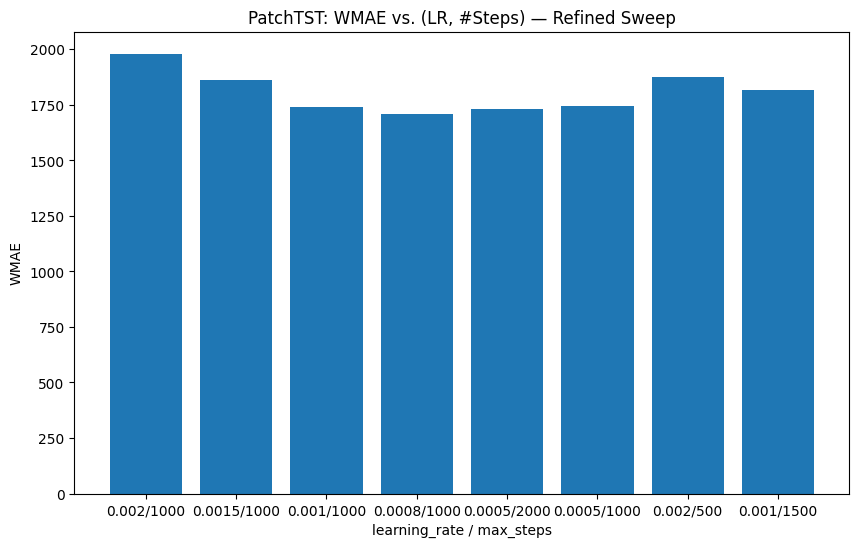

In [ ]:
import wandb
import matplotlib.pyplot as plt
from neuralforecast import NeuralForecast
from neuralforecast.models import PatchTST
from neuralforecast.losses.pytorch import MAE

# 1) Refined (learning_rate, max_steps) candidates around your best (1e-3, 1000)
lr_steps = [
    (2e-3,  1000),  # faster convergence, same budget
    (1.5e-3,1000),
    (1e-3,  1000),  # baseline
    (8e-4,  1000),
    (5e-4,  2000),  # lower LR, more updates
    (5e-4,  1000),
    (2e-3,   500),  # higher LR, fewer updates
    (1e-3,  1500),  # baseline LR, more updates
]

results = {}

# 2) All other hyper-parameters fixed at your best values
HORIZON        = forecast_horizon
INPUT_SIZE     = 58
PATCH_LEN      = 40
STRIDE         = 20
ENCODER_LAYERS = 1
N_HEADS        = 16
HIDDEN_SIZE    = 128

VAL_CHECK      = 100
EARLY_STOP     = 0
BATCH_SIZE     = 32

DROPOUT        = 0.1
FC_DROPOUT     = 0.2
HEAD_DROPOUT   = 0.1

SCALER_TYPE    = 'robust'
REVIN          = True

PROGRESS       = True
SEED           = 42
LOSS_NAME      = "MAE"

for lr, max_steps in lr_steps:
    run_name = f"PatchTST_lr{lr}_steps{max_steps}"
    wandb.init(
        project="ML_Final",
        name=run_name,
        reinit=True,
        config={
            "horizon":                  HORIZON,
            "input_size":               INPUT_SIZE,
            "patch_len":                PATCH_LEN,
            "stride":                   STRIDE,
            "encoder_layers":           ENCODER_LAYERS,
            "n_heads":                  N_HEADS,
            "hidden_size":              HIDDEN_SIZE,
            "learning_rate":            lr,
            "max_steps":                max_steps,
            "val_check_steps":          VAL_CHECK,
            "early_stop_patience_steps":EARLY_STOP,
            "batch_size":               BATCH_SIZE,
            "dropout":                  DROPOUT,
            "fc_dropout":               FC_DROPOUT,
            "head_dropout":             HEAD_DROPOUT,
            "scaler_type":              SCALER_TYPE,
            "revin":                    REVIN,
            "enable_progress_bar":      PROGRESS,
            "random_seed":              SEED,
            "loss":                     LOSS_NAME,
        }
    )

    # 3) Instantiate with this lr & max_steps
    model = PatchTST(
        h=HORIZON,
        input_size=INPUT_SIZE,
        patch_len=PATCH_LEN,
        stride=STRIDE,
        encoder_layers=ENCODER_LAYERS,
        n_heads=N_HEADS,
        hidden_size=HIDDEN_SIZE,

        loss=MAE(),
        learning_rate=lr,
        max_steps=max_steps,
        val_check_steps=VAL_CHECK,
        early_stop_patience_steps=EARLY_STOP,
        batch_size=BATCH_SIZE,

        dropout=DROPOUT,
        fc_dropout=FC_DROPOUT,
        head_dropout=HEAD_DROPOUT,

        scaler_type=SCALER_TYPE,
        revin=REVIN,

        enable_progress_bar=PROGRESS,
        random_seed=SEED
    )

    # 4) Train
    nf = NeuralForecast(models=[model], freq='W')
    nf.fit(df=train_final, val_size=0)

    # 5) Evaluate & log
    metrics = evaluate_and_log_patchtst(
        nf=nf,
        train_df=train_final,
        val_df=val_final,
        y_val=y_val,
        w_val=w_val,
        shift_days=5,
        split="val"
    )
    results[(lr, max_steps)] = metrics["WMAE"]

    wandb.finish()

# 6) Plot WMAE for each (lr, max_steps)
labels = [f"{lr}/{steps}" for lr, steps in results]
values = list(results.values())

plt.figure(figsize=(10,6))
plt.bar(labels, values)
plt.xlabel("learning_rate / max_steps")
plt.ylabel("WMAE")
plt.title("PatchTST: WMAE vs. (LR, #Steps) — Refined Sweep")
plt.show()


# train best model for test

In [ ]:
train_final = prepare_df_for_nf(train, is_train=True)
test_final = prepare_df_for_nf(test, is_train=False)

print(f"\nDate ranges:")
print(f"Train: {train_final['ds'].min()} to {train_final['ds'].max()}")
print(f"Test: {test_final['ds'].min()} to {test_final['ds'].max()}")
train_final.shape, train_final.columns, test_final.shape, test_final.columns,


Date ranges:
Train: 2010-02-05 00:00:00 to 2012-10-26 00:00:00
Test: 2012-11-02 00:00:00 to 2013-07-26 00:00:00


((421570, 6),
 Index(['Store', 'Dept', 'ds', 'y', 'IsHoliday', 'unique_id'], dtype='object'),
 (115064, 6),
 Index(['Store', 'Dept', 'ds', 'IsHoliday', 'y', 'unique_id'], dtype='object'))

In [ ]:
forecast_horizon = len(test_final['ds'].unique())
LR          = 8e-4
MAX_STEPS   = 20000
HORIZON        = forecast_horizon
INPUT_SIZE     = 62
PATCH_LEN      = 40
STRIDE         = 20
ENCODER_LAYERS = 1
N_HEADS        = 16
HIDDEN_SIZE    = 128

VAL_CHECK      = 100
EARLY_STOP     = 0
BATCH_SIZE     = 64

DROPOUT        = 0.1
FC_DROPOUT     = 0.1
HEAD_DROPOUT   = 0.1

SCALER_TYPE    = 'robust'
REVIN          = True

PROGRESS       = True
SEED           = 42
LOSS_NAME      = "MAE"

best_model = PatchTST(
    h=HORIZON,
    input_size=INPUT_SIZE,
    patch_len=PATCH_LEN,
    stride=STRIDE,
    encoder_layers=ENCODER_LAYERS,
    n_heads=N_HEADS,
    hidden_size=HIDDEN_SIZE,

    loss=MAE(),
    learning_rate=LR,
    max_steps=MAX_STEPS,
    val_check_steps=VAL_CHECK,
    early_stop_patience_steps=EARLY_STOP,
    batch_size=BATCH_SIZE,

    dropout=DROPOUT,
    fc_dropout=FC_DROPOUT,
    head_dropout=HEAD_DROPOUT,

    scaler_type=SCALER_TYPE,
    revin=REVIN,

    enable_progress_bar=PROGRESS,
    random_seed=SEED
)


nf = NeuralForecast(models=[best_model], freq='W')
nf.fit(df=train_final, val_size=0)

INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | loss         | MAE               | 0      | train
1 | padder_train | ConstantPad1d     | 0      | train
2 | scaler       | TemporalNorm      | 0      | train
3 | model        | PatchTST_backbone | 153 K  | train
-----------------------------------------------------------
153 K     Trainable params
1         Non-trainable params
153 K     Total params
0.613     Total estimated model params size (MB)
40        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=20000` reached.


In [ ]:
wandb.init(
    project="ML_Final",
    name="PatchTST_Final_Model_2",
    reinit=True,
    config={
        "horizon":                         forecast_horizon,
        "input_size":                      INPUT_SIZE,
        "patch_len":                       PATCH_LEN,
        "stride":                          STRIDE,
        "encoder_layers":                  ENCODER_LAYERS,
        "n_heads":                         N_HEADS,
        "hidden_size":                     HIDDEN_SIZE,
        "learning_rate":                   LR,
        "max_steps":                       MAX_STEPS,
        "val_check_steps":                 VAL_CHECK,
        "early_stop_patience_steps":       EARLY_STOP,
        "batch_size":                      BATCH_SIZE,
        "dropout":                         DROPOUT,
        "fc_dropout":                      FC_DROPOUT,
        "head_dropout":                    HEAD_DROPOUT,
        "scaler_type":                     SCALER_TYPE,
        "revin":                           REVIN,
        "enable_progress_bar":             PROGRESS,
        "random_seed":                     SEED,
        "loss":                            LOSS_NAME,
    }
)

wandb.config.update({"model_arch": str(best_model)}, allow_val_change=True)
wandb.finish()


In [ ]:
final_preds = nf.predict(df=train_final)
final_preds = shift_ds_by_days(final_preds, 5)
final_preds.shape, final_preds.head(), test.shape, test.head()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

((129909, 3),
   unique_id         ds      PatchTST
 0      10_1 2012-11-02  29438.416016
 1      10_1 2012-11-09  29122.703125
 2      10_1 2012-11-16  28202.300781
 3      10_1 2012-11-23  28465.632812
 4      10_1 2012-11-30  29277.382812,
 (115064, 4),
    Store  Dept        Date  IsHoliday
 0      1     1  2012-11-02      False
 1      1     1  2012-11-09      False
 2      1     1  2012-11-16      False
 3      1     1  2012-11-23       True
 4      1     1  2012-11-30      False)

In [ ]:
# 1. Prepare the test key‐frame
test_df = test_final[['unique_id', 'ds']].copy()

# 2. Merge your PatchTST predictions into the test frame
sub = (
    test_df
    .merge(final_preds[['unique_id', 'ds', 'PatchTST']],
           on=['unique_id','ds'], how='left')
    .rename(columns={'PatchTST': 'Weekly_Sales'})
)

# 3. Recover Store and Dept from unique_id
sub[['Dept','Store']] = sub['unique_id'].str.split('_', expand=True)
sub['Store'] = sub['Store'].astype(int)
sub['Dept']  = sub['Dept'].astype(int)

# 4. Compute store‐level average Weekly_Sales from the original train
store_means = train.groupby('Store')['Weekly_Sales'].mean()

# 5. Fill missing model forecasts with the store‐level mean
sub['Weekly_Sales'] = sub['Weekly_Sales'].fillna(sub['Store'].map(store_means))

# 6. Build the Kaggle "Id" column: e.g. "1_1_2012-11-02"
sub['Id'] = (
    sub['Store'].astype(str) + '_' +
    sub['Dept'].astype(str)  + '_' +
    sub['ds'].dt.strftime('%Y-%m-%d')
)

# 7. Final submission: select only Id + Weekly_Sales
submission = sub[['Id','Weekly_Sales']]

# 8. Save to CSV
submission.to_csv('PatchTST_submission.csv', index=False)
print(f"Saved PatchTST_submission.csv with {len(submission)} rows.")

# 9. Preview first few lines
submission.shape, submission.head()

Saved PatchTST_submission.csv with 115064 rows.


((115064, 2),
                Id  Weekly_Sales
 0  1_1_2012-11-02  29198.277344
 1  1_1_2012-11-09  21447.212891
 2  1_1_2012-11-16  20738.734375
 3  1_1_2012-11-23  21147.904297
 4  1_1_2012-11-30  25643.859375)